In [1]:
import pandas as pd
import torch
import random
import numpy as np
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
from sklearn.model_selection import KFold
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.data import Sampler

df = pd.read_csv("../data/csr_embeddings_leq2019_citation_count_cpc.csv")

## Seed

In [2]:
def set_seed(seed=42):
    random.seed(seed) # 控制 Python 內建的 random 模組（例如 random.shuffle()、random.randint()）。
    np.random.seed(seed) # 控制 NumPy 所有隨機操作（例如 np.random.rand()、np.random.shuffle()）。
    torch.manual_seed(seed) # 控制 CPU 上 PyTorch 的隨機性（例如 torch.rand()）。
    torch.cuda.manual_seed(seed)  # for CUDA
    torch.cuda.manual_seed_all(seed)  # for multi-GPU

    torch.backends.cudnn.deterministic = True  # 強制使用 deterministic（確定性）版本的 CuDNN 操作，避免某些 kernel 造成非一致性輸出。
    torch.backends.cudnn.benchmark = False     # 關閉 CuDNN 根據輸入自動選最佳演算法的機制，避免因選到不同 kernel 而有不同結果。

set_seed(42)

In [3]:
df

,file_name,dim_0,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,...,dim_1018,dim_1019,dim_1020,dim_1021,dim_1022,dim_1023,ticker,year,total_5yr_forward_citations,patents_count
0,NASDAQ_AMZN_2019,-0.013089,0.263785,-0.097623,-0.033070,0.000627,0.072135,-0.044153,0.016454,0.148158,...,0.364370,-0.222883,-0.286277,-0.081639,-0.161185,0.141298,AMZN,2019,118.0,10.0
1,NASDAQ_GILD_2016,-0.086015,0.255328,-0.011454,0.026999,-0.120548,0.098053,-0.151887,-0.091115,-0.018867,...,0.282260,-0.178336,-0.302124,-0.008873,-0.080819,0.121339,GILD,2016,143.0,11.0
2,NASDAQ_GILD_2017,-0.065964,0.268716,0.020811,0.020799,-0.161803,0.068956,-0.136440,-0.065431,-0.038250,...,0.246257,-0.187174,-0.374117,0.010569,-0.065381,0.150525,GILD,2017,41.0,2.0
3,NASDAQ_GILD_2018,-0.022194,0.237016,-0.015546,-0.036130,-0.120120,0.110030,-0.120481,-0.068459,0.011013,...,0.290036,-0.193760,-0.362832,0.005057,-0.076889,0.169497,GILD,2018,17.0,4.0
4,NASDAQ_GILD_2019,-0.036139,0.229826,-0.050487,-0.056055,-0.176103,0.238493,-0.019966,0.047148,-0.076514,...,0.315844,-0.144334,-0.564718,-0.058412,-0.077617,0.158002,GILD,2019,36.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1483,NYSE_XRX_2019,-0.107306,0.273209,-0.103959,-0.001074,-0.034088,0.069932,-0.120183,-0.036632,0.132176,...,0.369505,-0.079411,-0.255776,0.003702,-0.204953,0.158863,XRX,2019,0.0,0.0
1484,NYSE_XYL_2018,-0.128076,0.242467,-0.105685,-0.002712,-0.121495,0.049107,-0.150115,0.002445,0.126636,...,0.374914,-0.140273,-0.278945,-0.068210,-0.167383,0.143690,XYL,2018,4.0,1.0
1485,NYSE_XYL_2019,-0.130437,0.244693,-0.099858,-0.026105,-0.078515,0.036908,-0.180308,-0.023406,0.156801,...,0.398237,-0.154443,-0.254707,-0.067338,-0.108709,0.155109,XYL,2019,0.0,0.0
1486,NYSE_X_2017,-0.118326,0.278188,-0.046291,0.034599,-0.051919,0.031961,-0.078014,-0.108625,0.110804,...,0.324046,-0.028531,-0.368959,-0.016136,-0.205353,0.093804,X,2017,0.0,0.0


## Dataset

In [ ]:
# y target columns
y_cols = ['patents_count', 'total_5yr_forward_citations']

# 計算 mean 和 std
y_mean_array = df[y_cols].mean().values
y_std_array = df[y_cols].std().values

# Step 1: 對所有資料標準化
y_raw = df[y_cols].values
y_standardized = (y_raw - y_mean_array) / y_std_array

# Step 2: 找出每一個目標欄位的最小值
y_min = y_standardized.min(axis=0)  # shape: (2,)

# Step 3: 建立 shift_array，使標準化後的最小值變成 0
# ✅ 這樣可確保：模型預測為 0 時，代表的是真實值的最小值（便於 ReLU 輸出與解釋）
shift_array = -y_min

In [ ]:
class SimpleCSRDataset(torch.utils.data.Dataset):
    def __init__(self, df):
        self.x = torch.tensor(df[[f'dim_{i}' for i in range(1024)]].values, dtype=torch.float32)
        y = df[['patents_count', 'total_5yr_forward_citations']].values
        y = (y - y_mean_array) / y_std_array  # Z-score normalization
        y += shift_array  
        self.y = torch.tensor(y, dtype=torch.float32)
        self.indexes = df.index.tolist()

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        return self.x[idx], self.y[idx], self.indexes[idx]

In [6]:
# 原始目標值
y_raw = df[y_cols].values

# 標準化後（尚未 shift）
y_standardized = (y_raw - y_mean_array) / y_std_array

# 轉成 DataFrame 查看統計摘要
y_std_df = pd.DataFrame(y_standardized, columns=y_cols)
print(y_std_df.describe())

       patents_count  total_5yr_forward_citations
count   1.488000e+03                 1.488000e+03
mean    1.910061e-17                 2.387576e-18
std     1.000000e+00                 1.000000e+00
min    -2.349391e-01                -2.324409e-01
25%    -2.349391e-01                -2.324409e-01
50%    -2.349391e-01                -2.324409e-01
75%    -1.562559e-01                -1.935061e-01
max     1.475421e+01                 1.378407e+01


In [7]:
dataset = SimpleCSRDataset(df)

# 將 tensor 轉成 pandas DataFrame
y_df = pd.DataFrame(dataset.y.numpy(), columns=['patents_count', 'total_5yr_forward_citations'])

# 查看統計摘要
print(y_df.describe())


       patents_count  total_5yr_forward_citations
count    1488.000000                  1488.000000
mean        0.234939                     0.232441
std         0.999994                     1.000006
min         0.000000                     0.000000
25%         0.000000                     0.000000
50%         0.000000                     0.000000
75%         0.078683                     0.038935
max        14.989146                    14.016512


## Unormalize

In [8]:
def unnormalize_shifted(tensor, mean_array, std_array, shift_array):
    return ((tensor - shift_array) * std_array) + mean_array

## Model

In [9]:
class MLP_MTL(nn.Module):
    def __init__(self, input_dim=1024, hidden_dim=256, head_dim=32):
        super().__init__()
        self.shared = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(hidden_dim, head_dim),
            nn.ReLU()
        )
        self.head_count = nn.Sequential(nn.Linear(head_dim, 1), nn.ReLU())
        self.head_citation = nn.Sequential(nn.Linear(head_dim, 1), nn.ReLU())

    def forward(self, x):  # x: [B, 1024]
        shared_out = self.shared(x)
        y1 = self.head_count(shared_out)
        y2 = self.head_citation(shared_out)
        return torch.cat([y1, y2], dim=1)  # [B, 2]

## Evaluation metrics

In [10]:
def compute_metrics(y_pred, y_true):
    if isinstance(y_pred, torch.Tensor):
        y_pred = y_pred.detach().cpu().numpy()
    if isinstance(y_true, torch.Tensor):
        y_true = y_true.detach().cpu().numpy()

    y_pred = unnormalize_shifted(y_pred, y_mean_array, y_std_array, shift_array)
    y_true = unnormalize_shifted(y_true, y_mean_array, y_std_array, shift_array)

    metrics = {}
    for i, name in enumerate(["count", "citation"]):
        y_p, y_t = y_pred[:, i], y_true[:, i]
        mse = np.mean((y_p - y_t) ** 2)
        mae = np.mean(np.abs(y_p - y_t))
        rmse = np.sqrt(mse)
        smape = np.mean(2 * np.abs(y_p - y_t) / (np.abs(y_p) + np.abs(y_t) + 1e-8)) * 100
        metrics[name] = {"MSE": mse, "MAE": mae, "RMSE": rmse, "SMAPE": smape}
    return metrics

## Loss function

In [11]:
class MSEPunishLoss(nn.Module):
    def __init__(self, alpha=1.0, punish_mode='', return_each=False):
        """
        :param alpha: 懲罰項權重
        :param punish_mode: 'abs', 'square', 'binary', 'huber', 'ratio', 'threshold'
        :param return_each: 是否回傳 count loss 和 citation loss
        """
        super().__init__()
        self.mse = nn.MSELoss()
        self.alpha = alpha
        self.punish_mode = punish_mode
        self.return_each = return_each

    def forward(self, preds, targets):
        pred_count, pred_citation = preds[:, 0], preds[:, 1]
        true_count, true_citation = targets[:, 0], targets[:, 1]

        loss_count = self.mse(pred_count, true_count)
        loss_citation = self.mse(pred_citation, true_citation)
        loss_total = loss_count + loss_citation

        # Initialize punishment
        punishment = 0.0

        if self.punish_mode:
            mask = (true_count == 0)
            if mask.sum() > 0:
                if self.punish_mode == 'abs':
                    punishment = torch.sum(torch.abs(pred_citation[mask]))
                elif self.punish_mode == 'square':
                    punishment = torch.sum((pred_citation[mask]) ** 2)
                elif self.punish_mode == 'binary':
                    punishment = torch.sum((pred_citation[mask] > 1e-4).float())
                elif self.punish_mode == 'huber':
                    punishment = nn.functional.smooth_l1_loss(
                        pred_citation[mask],
                        torch.zeros_like(pred_citation[mask]),
                        reduction='sum'
                    )
                elif self.punish_mode == 'ratio':
                    safe_count = true_count + 1e-6
                    ratio = pred_citation / safe_count
                    punishment = torch.sum(ratio[mask])
                elif self.punish_mode == 'threshold':
                    threshold = 1.0
                    over = torch.clamp(pred_citation[mask] - threshold, min=0)
                    punishment = torch.sum(over)
                else:
                    raise ValueError(f"Unsupported punish_mode: {self.punish_mode}")

        loss_total = loss_total + self.alpha * punishment

        if self.return_each:
            return loss_total, loss_count.item(), loss_citation.item()
        else:
            return loss_total

## StratifiedKFold

In [12]:
from sklearn.model_selection import StratifiedKFold

company_df = df.groupby('ticker')[['patents_count', 'total_5yr_forward_citations']].mean().reset_index()

# Step 1: 建立 count 是否為 0 的 flag
company_df['has_patents'] = (company_df['patents_count'] > 0).astype(int)

# Step 2: 對 citation 進行分箱（只對有產出的公司分）
bins = [-1, 0, 10, 50, 200, np.inf]
company_df['citation_bin'] = pd.cut(company_df['total_5yr_forward_citations'], bins=bins, labels=False)

# Step 3: 建立綜合 stratify 標籤
# 沒有產出的公司統一為 0，有產出者根據 citation_bin 分層
company_df['stratify_label'] = company_df.apply(
    lambda row: 0 if row['has_patents'] == 0 else row['citation_bin'] + 1,
    axis=1
)

stratified_kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

folds = []
for train_idx, test_idx in stratified_kf.split(company_df['ticker'], company_df['stratify_label']):
    train_coms = company_df.iloc[train_idx]['ticker'].values
    test_coms = company_df.iloc[test_idx]['ticker'].values
    folds.append((train_coms, test_coms))


In [13]:
# Citation 統計
mean_cit_all = df['total_5yr_forward_citations'].mean()
std_cit_all = df['total_5yr_forward_citations'].std()
max_cit_all = df['total_5yr_forward_citations'].max()

# Count 統計
mean_cnt_all = df['patents_count'].mean()
std_cnt_all = df['patents_count'].std()
max_cnt_all = df['patents_count'].max()

# 無專利公司比例
company_level_all = df.groupby('ticker')['patents_count'].sum().reset_index()
no_patent_ratio_all = (company_level_all['patents_count'] == 0).mean() * 100

print("[All Data]")
print(f"  Citation → mean: {mean_cit_all:.2f} | std: {std_cit_all:.2f} | max: {max_cit_all:.2f}")
print(f"  Count    → mean: {mean_cnt_all:.2f} | std: {std_cnt_all:.2f} | max: {max_cnt_all:.2f}")
print(f"  % Companies with NO patents: {no_patent_ratio_all:.1f}%")


[All Data]
  Citation → mean: 47.76 | std: 205.47 | max: 2880.00
  Count    → mean: 5.97 | std: 25.42 | max: 381.00
  % Companies with NO patents: 35.3%


In [14]:
for i, (_, test_coms) in enumerate(folds):
    sub_df = df[df['ticker'].isin(test_coms)]

    # Citation 統計
    mean_cit = sub_df['total_5yr_forward_citations'].mean()
    std_cit = sub_df['total_5yr_forward_citations'].std()
    max_cit = sub_df['total_5yr_forward_citations'].max()

    # Count 統計
    mean_cnt = sub_df['patents_count'].mean()
    std_cnt = sub_df['patents_count'].std()
    max_cnt = sub_df['patents_count'].max()

    # 無專利公司比例
    company_level = sub_df.groupby('ticker')['patents_count'].sum().reset_index()
    no_patent_ratio = (company_level['patents_count'] == 0).mean() * 100

    print(f"[Fold {i+1}]")
    print(f"  Citation → mean: {mean_cit:.2f} | std: {std_cit:.2f} | max: {max_cit:.2f}")
    print(f"  Count    → mean: {mean_cnt:.2f} | std: {std_cnt:.2f} | max: {max_cnt:.2f}")
    print(f"  % Companies with NO patents: {no_patent_ratio:.1f}%")

[Fold 1]
  Citation → mean: 39.18 | std: 241.13 | max: 2880.00
  Count    → mean: 1.77 | std: 4.79 | max: 48.00
  % Companies with NO patents: 34.4%
[Fold 2]
  Citation → mean: 57.34 | std: 199.79 | max: 1929.00
  Count    → mean: 7.11 | std: 21.60 | max: 160.00
  % Companies with NO patents: 34.4%
[Fold 3]
  Citation → mean: 71.00 | std: 265.57 | max: 2519.00
  Count    → mean: 12.11 | std: 45.46 | max: 381.00
  % Companies with NO patents: 34.4%
[Fold 4]
  Citation → mean: 41.55 | std: 163.92 | max: 1439.00
  Count    → mean: 5.87 | std: 25.53 | max: 204.00
  % Companies with NO patents: 36.7%
[Fold 5]
  Citation → mean: 29.51 | std: 111.98 | max: 1264.00
  Count    → mean: 3.48 | std: 9.40 | max: 73.00
  % Companies with NO patents: 36.7%


In [15]:
print("📊 Validation Set Sample Counts per Fold")
for i, (_, test_coms) in enumerate(folds):
    val_df = df[df['ticker'].isin(test_coms)]
    print(f"Fold {i+1}: {len(val_df)} samples")


📊 Validation Set Sample Counts per Fold
Fold 1: 326 samples
Fold 2: 323 samples
Fold 3: 283 samples
Fold 4: 272 samples
Fold 5: 284 samples


In [16]:
print("📊 Train/Validation Set Sample Counts per Fold")
for i, (train_coms, test_coms) in enumerate(folds):
    train_df = df[df['ticker'].isin(train_coms)]
    val_df = df[df['ticker'].isin(test_coms)]
    print(f"Fold {i+1}: Train = {len(train_df)}, Validation = {len(val_df)}")


📊 Train/Validation Set Sample Counts per Fold
Fold 1: Train = 1162, Validation = 326
Fold 2: Train = 1165, Validation = 323
Fold 3: Train = 1205, Validation = 283
Fold 4: Train = 1216, Validation = 272
Fold 5: Train = 1204, Validation = 284


## Evaluate best model

In [17]:
def evaluate_best_model(model, val_loader, fold_id, best_epoch):
    """
    回傳最佳模型在驗證集上的預測、標籤與 meta info（用於 CSV 儲存）
    """
    model.eval()
    all_preds = []
    all_y = []
    val_meta_info = []

    with torch.no_grad():
        for batch_id, batch in enumerate(val_loader):
            x_seqs, y_seqs, indices = zip(*batch)
            x_seqs = torch.stack(x_seqs).to(next(model.parameters()).device)
            y_seqs = torch.stack(y_seqs).to(next(model.parameters()).device)

            preds = model(x_seqs)

            all_preds.append(preds.cpu())
            all_y.append(y_seqs.cpu())

            for i, index in enumerate(indices):
                val_meta_info.append({
                    "fold": fold_id + 1,
                    "epoch": best_epoch + 1,
                    "batch": batch_id + 1,
                    "sample": i,
                    "index": index
                })

    return [torch.cat(all_preds)], [torch.cat(all_y)], [val_meta_info]

## Training

In [18]:
## Training
# --- Training Config ---
## 5-fold Cross Validation
company_ids = df['ticker'].unique()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

epochs = 100
learning_rate = 1e-4

# 初始化儲存所有 fold 的 loss
all_train_losses_total, all_train_losses_count, all_train_losses_citation = [], [], []
all_train_preds_total, all_train_targets_total, all_train_meta_info_total = [], [], []

all_val_losses_count, all_val_losses_citation ,all_val_losses_total = [], [], []
all_val_preds_total, all_val_targets_total, all_val_meta_info_total = [], [], []

best_epoch_list = []

for fold_id, (train_coms, test_coms) in enumerate(folds):
    print(f"\n====== Fold {fold_id+1} ======")

    fold_train_preds_epochs, fold_train_targets_epochs, fold_train_meta_epochs = [], [], []
    fold_val_preds_epochs, fold_val_targets_epochs, fold_val_meta_epochs = [], [], []
    
    # Dataset   
    train_df = df[df['ticker'].isin(train_coms)].copy()
    val_df = df[df['ticker'].isin(test_coms)].copy()

    train_dataset = SimpleCSRDataset(train_df)
    val_dataset = SimpleCSRDataset(val_df)

    generator = torch.Generator().manual_seed(42)

    # DataLoader
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=lambda x: x, generator=generator)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: x)

    # Model
    model = MLP_MTL().to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
    criterion = MSEPunishLoss(alpha=1.0, punish_mode='', return_each=True)

    # 儲存每個 epoch 的 loss（每 fold 一份）
    train_loss_total_list, train_loss_count_list, train_loss_citation_list = [], [], []
    val_loss_total_list, val_loss_count_list, val_loss_citation_list = [], [], []

    # <-- Early Stopping 初始化 -->
    best_val_loss = float('inf')
    epochs_no_improve = 0
    patience = 50
    best_model_state = None
    best_epoch = None  

    for epoch in range(epochs):
        model.train()
        epoch_losses, epoch_loss_count_all, epoch_loss_citation_all = [], [], []
        train_preds, train_targets, train_meta_info = [], [], []
        for batch_id, batch in enumerate(train_loader):
            x, y, idxs = zip(*batch)
            x = torch.stack(x).to(device)
            y = torch.stack(y).to(device)

            preds = model(x)

            loss_total, loss_count, loss_citation = criterion(preds, y)
            optimizer.zero_grad()
            loss_total.backward()
            optimizer.step()

            epoch_losses.append(loss_total.item())
            epoch_loss_count_all.append(loss_count)
            epoch_loss_citation_all.append(loss_citation)

            train_preds.append(preds.detach().cpu())
            train_targets.append(y.detach().cpu())

            for i, index in enumerate(idxs):
                train_meta_info.append({
                    "fold": fold_id + 1,
                    "epoch": epoch + 1,
                    "batch": batch_id + 1,
                    "sample": i,
                    "index": index
                })

            # # ✔ 每個 batch 印 loss、predictions、truth
            # print(f"[Fold {fold_id+1}][Epoch {epoch+1}][Train][Batch] Company: {tickers[0]} | Samples: {len(indices)}")
            # print(f"  Total Loss: {loss_total.item():.4f} | Count Loss: {loss_count:.4f} | Citation Loss: {loss_citation:.4f}")
            # print(f"  Predictions (expm1, rounded): {np.round(torch.expm1(preds).detach().cpu().numpy())}")
            # print(f"  Ground truth (expm1, rounded): {np.round(torch.expm1(y).detach().cpu().numpy())}")
            # print(f"  Indices: {indices}")

        avg_train_loss = np.mean(epoch_losses)
        avg_train_count = np.mean(epoch_loss_count_all)
        avg_train_citation = np.mean(epoch_loss_citation_all)

        train_loss_total_list.append(avg_train_loss)
        train_loss_count_list.append(avg_train_count)
        train_loss_citation_list.append(avg_train_citation)

        fold_train_meta_epochs.append(train_meta_info)
        fold_train_preds_epochs.append(torch.cat(train_preds))
        fold_train_targets_epochs.append(torch.cat(train_targets))

        # Validation
        model.eval()
        with torch.no_grad():
            val_losses = []
            val_loss_count_all = []
            val_loss_citation_all = []
            all_preds = []
            all_y = []
            val_meta_info = []  # <--- 新增：本 epoch 的 meta 資訊
            for batch_id, batch in enumerate(val_loader):
                x, y, idxs = zip(*batch)
                x = torch.stack(x).to(device)
                y = torch.stack(y).to(device)

                preds = model(x)
                loss_total, loss_count, loss_citation = criterion(preds, y)
                
                val_losses.append(loss_total.item())
                val_loss_count_all.append(loss_count)
                val_loss_citation_all.append(loss_citation)

                all_preds.append(preds)
                all_y.append(y)

                # 💾 新增：記錄每一筆的 fold / epoch / batch / sample index
                for i, index in enumerate(idxs):
                    val_meta_info.append({
                        "fold": fold_id + 1,
                        "epoch": epoch + 1,
                        "batch": batch_id + 1,
                        "sample": i,
                        "index": index  # 原始 index 儲存以便後續追蹤
                    })

                preds_np = unnormalize_shifted(preds.cpu().numpy(), y_mean_array, y_std_array, shift_array)
                y_np = unnormalize_shifted(y.cpu().numpy(), y_mean_array, y_std_array, shift_array)
                # ✔ 每個 batch 印 loss、predictions、truth
                print(f"[Fold {fold_id+1}][Epoch {epoch+1}][Val][Batch] | Samples: {len(x)}")
                print(f"  Total Loss: {loss_total.item():.4f} | Count Loss: {loss_count:.4f} | Citation Loss: {loss_citation:.4f}")
                print(f"  Predictions (restored, rounded): {np.round(preds_np)}")
                print(f"  Ground truth (restored, rounded): {np.round(y_np)}")
                print(f"  Indices: {idxs}")

            fold_val_preds_epochs.append(torch.cat(all_preds).cpu())
            fold_val_targets_epochs.append(torch.cat(all_y).cpu())
            fold_val_meta_epochs.append(val_meta_info)

            avg_val_loss = np.mean(val_losses)
            avg_val_count = np.mean(val_loss_count_all)
            avg_val_citation = np.mean(val_loss_citation_all)

            val_loss_total_list.append(avg_val_loss)
            val_loss_count_list.append(avg_val_count)
            val_loss_citation_list.append(avg_val_citation)

            all_preds = torch.cat(all_preds)
            all_y = torch.cat(all_y)

            # ✔ 每個 epoch 最後 summary
            print(f"[Fold {fold_id+1}][Epoch {epoch+1}] Summary")
            print(f"  Train Avg Loss     -> Total: {avg_train_loss:.4f} | Count: {avg_train_count:.4f} | Citation: {avg_train_citation:.4f}")
            print(f"  Validation Avg Loss-> Total: {avg_val_loss:.4f} | Count: {avg_val_count:.4f} | Citation: {avg_val_citation:.4f}")

        metrics = compute_metrics(all_preds.cpu(), all_y.cpu())
        for name, vals in metrics.items():
            print(f"  [{name.upper()}] Metrics -> MSE: {vals['MSE']:.4f} | MAE: {vals['MAE']:.4f} | "
                f"RMSE: {vals['RMSE']:.4f} | SMAPE: {vals['SMAPE']:.2f}%")

        # <-- Early Stopping 判斷 -->
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            best_model_state = model.state_dict()
            best_epoch = epoch
            print(f"  ✅ Validation loss improved. Saving model.")
        else:
            epochs_no_improve += 1
            print(f"  ❌ No improvement. Patience: {epochs_no_improve}/{patience}")

        if epochs_no_improve >= patience:
            print(f"  ⏹ Early stopping triggered at epoch {epoch+1}. Best val_loss: {best_val_loss:.4f}")
        print(f"  🔄 Best model loaded from epoch {best_epoch+1}")

    if best_model_state is not None:
        # 有早停（代表中途有最佳模型）
        model.load_state_dict(best_model_state)
        print("  🔄 Best model loaded for final evaluation or saving.")
        fold_val_preds_epochs, fold_val_targets_epochs, fold_val_meta_epochs = evaluate_best_model(
            model, val_loader, fold_id, best_epoch
        )
    else:
        # 沒有早停（跑滿 epochs），此時就保留最後一輪模型，照樣 evaluate
        print("  ⚠️ No best model found. Using final epoch model for evaluation.")
        fold_val_preds_epochs, fold_val_targets_epochs, fold_val_meta_epochs = evaluate_best_model(
            model, val_loader, fold_id, epoch  # 此時 epoch 就是最後一輪 index
        )

    # 每個 fold 儲存進總表中
    all_train_losses_total.append(train_loss_total_list)
    all_train_losses_count.append(train_loss_count_list)
    all_train_losses_citation.append(train_loss_citation_list)

    all_train_preds_total.append(fold_train_preds_epochs)
    all_train_targets_total.append(fold_train_targets_epochs)
    all_train_meta_info_total.append(fold_train_meta_epochs)

    all_val_losses_total.append(val_loss_total_list)
    all_val_losses_count.append(val_loss_count_list)
    all_val_losses_citation.append(val_loss_citation_list)

    all_val_preds_total.append(fold_val_preds_epochs)
    all_val_targets_total.append(fold_val_targets_epochs)
    all_val_meta_info_total.append(fold_val_meta_epochs)

    best_epoch_list.append(best_epoch + 1 if best_epoch is not None else epochs)


====== Fold 1 ======
[Fold 1][Epoch 1][Val][Batch] | Samples: 16
  Total Loss: 0.0167 | Count Loss: 0.0051 | Citation Loss: 0.0116
  Predictions (restored, rounded): [[ 0. 25.]
 [ 0. 27.]
 [ 0. 23.]
 [ 0. 23.]
 [ 0. 25.]
 [ 0. 24.]
 [ 0. 22.]
 [ 0. 25.]
 [ 0. 26.]
 [ 0. 24.]
 [ 0. 25.]
 [ 0. 25.]
 [ 0. 26.]
 [ 0. 26.]
 [ 0. 26.]
 [ 0. 26.]]
  Ground truth (restored, rounded): [[ 2.  3.]
 [ 1.  1.]
 [ 2.  6.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]
 [ 1.  2.]
 [ 3. 66.]
 [ 2.  7.]
 [ 1. 24.]
 [ 3. 18.]
 [ 2. 14.]
 [ 4. 33.]
 [ 0.  0.]
 [ 0.  0.]
 [ 0.  0.]]
  Indices: (6, 7, 8, 78, 79, 80, 81, 82, 83, 84, 85, 86, 111, 121, 122, 130)
[Fold 1][Epoch 1][Val][Batch] | Samples: 16
  Total Loss: 1.4659 | Count Loss: 0.3630 | Citation Loss: 1.1028
  Predictions (restored, rounded): [[ 0. 26.]
 [ 0. 23.]
 [ 0. 27.]
 [ 0. 23.]
 [ 0. 23.]
 [ 0. 22.]
 [ 0. 27.]
 [ 0. 27.]
 [ 0. 26.]
 [ 0. 26.]
 [ 0. 27.]
 [ 0. 23.]
 [ 0. 20.]
 [ 0. 19.]
 [ 0. 23.]
 [ 0. 29.]]
  Ground truth (restored, rounded): [[  1.  

## compute_sample_metrics

In [19]:
def compute_sample_metrics(y_true, y_pred):
    """
    y_true, y_pred: shape [N, 2] numpy array, already expm1'd
    回傳 dict，包含每筆樣本的 MSE, MAE, RMSE, SMAPE for count & citation
    """
    abs_error = np.abs(y_pred - y_true)
    squared_error = (y_pred - y_true) ** 2
    rmse_error = np.sqrt(squared_error)
    smape_error = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)

    return {
        "count_MSE": squared_error[:, 0],
        "count_MAE": abs_error[:, 0],
        "count_RMSE": rmse_error[:, 0],
        "count_SMAPE": smape_error[:, 0],
        "citation_MSE": squared_error[:, 1],
        "citation_MAE": abs_error[:, 1],
        "citation_RMSE": rmse_error[:, 1],
        "citation_SMAPE": smape_error[:, 1],
    }

# Save validation result to csv

In [ ]:
val_summary_records, train_summary_records = [], []

for fold_id in range(len(folds)):
    # === Validation ===
    fold_preds = all_val_preds_total[fold_id][0].cpu().numpy()
    fold_targets = all_val_targets_total[fold_id][0].cpu().numpy()
    fold_meta_info = all_val_meta_info_total[fold_id][0]

    y_pred = unnormalize_shifted(fold_preds, y_mean_array, y_std_array, shift_array)
    y_true = unnormalize_shifted(fold_targets, y_mean_array, y_std_array, shift_array)

    metrics = compute_sample_metrics(y_true, y_pred)

    for i, meta in enumerate(fold_meta_info):
        val_summary_records.append({
            "fold": meta["fold"],
            "epoch": meta["epoch"],
            "batch": meta["batch"],
            "local_sample": meta["sample"],
            "index": meta["index"],
            "file": df.iloc[meta["index"]]["file_name"],
            "val_true_count": round(y_true[i, 0], 4),
            "val_pred_count": round(y_pred[i, 0], 4),
            "val_true_citation": round(y_true[i, 1], 4),
            "val_pred_citation": round(y_pred[i, 1], 4),
            "val_count_MSE": round(metrics["count_MSE"][i], 4),
            "val_count_MAE": round(metrics["count_MAE"][i], 4),
            "val_count_SMAPE": round(metrics["count_SMAPE"][i], 4),
            "val_citation_MSE": round(metrics["citation_MSE"][i], 4),
            "val_citation_MAE": round(metrics["citation_MAE"][i], 4),
            "val_citation_SMAPE": round(metrics["citation_SMAPE"][i], 4),
            # train 留空
            "train_true_count": np.nan,
            "train_pred_count": np.nan,
            "train_true_citation": np.nan,
            "train_pred_citation": np.nan,
            "train_loss_total": np.nan,
            "train_loss_count": np.nan,
            "train_loss_citation": np.nan,
            "train_count_MSE": np.nan,
            "train_count_MAE": np.nan,
            "train_count_SMAPE": np.nan,
            "train_citation_MSE": np.nan,
            "train_citation_MAE": np.nan,
            "train_citation_SMAPE": np.nan,
        })

    # === Training ===
    for epoch in range(len(all_train_preds_total[fold_id])):
        fold_preds = all_train_preds_total[fold_id][epoch].cpu()
        fold_targets = all_train_targets_total[fold_id][epoch].cpu()
        fold_meta_info = all_train_meta_info_total[fold_id][epoch]

        y_pred = unnormalize_shifted(fold_preds, y_mean_array, y_std_array, shift_array)
        y_true = unnormalize_shifted(fold_targets, y_mean_array, y_std_array, shift_array)

        metrics = compute_sample_metrics(y_true, y_pred)

        for i, meta in enumerate(fold_meta_info):
            train_summary_records.append({
                "fold": meta["fold"],
                "epoch": meta["epoch"],
                "batch": meta["batch"],
                "local_sample": meta["sample"],
                "index": meta["index"],
                "file": df.iloc[meta["index"]]["file_name"],
                # val 留空
                "val_true_count": np.nan,
                "val_pred_count": np.nan,
                "val_true_citation": np.nan,
                "val_pred_citation": np.nan,
                "val_loss_total": np.nan,
                "val_loss_count": np.nan,
                "val_loss_citation": np.nan,
                "val_count_MSE": np.nan,
                "val_count_MAE": np.nan,
                "val_count_SMAPE": np.nan,
                "val_citation_MSE": np.nan,
                "val_citation_MAE": np.nan,
                "val_citation_SMAPE": np.nan,
                # train 留資料
                "train_true_count": round(y_true[i, 0].item(), 4),
                "train_pred_count": round(y_pred[i, 0].item(), 4),
                "train_true_citation": round(y_true[i, 1].item(), 4),
                "train_pred_citation": round(y_pred[i, 1].item(), 4),
                "train_count_MSE": round(metrics["count_MSE"][i].item(), 4),
                "train_count_MAE": round(metrics["count_MAE"][i].item(), 4),
                "train_count_SMAPE": round(metrics["count_SMAPE"][i].item(), 4),
                "train_citation_MSE": round(metrics["citation_MSE"][i].item(), 4),
                "train_citation_MAE": round(metrics["citation_MAE"][i].item(), 4),
                "train_citation_SMAPE": round(metrics["citation_SMAPE"][i].item(), 4),
            })

# 儲存 CSV
val_summary_df = pd.DataFrame(val_summary_records)
train_summary_df = pd.DataFrame(train_summary_records)
combined_df = pd.concat([val_summary_df, train_summary_df], ignore_index=True)
val_summary_df.to_csv("../output/mlp_mtl_v4_std_shift_min_0_val_detailed.csv", index=False)
combined_df.to_csv("../output/mlp_mtl_v4_std_shift_min_0_train_val_detailed.csv", index=False)
print("✅ Saved detailed validation results to 'train_val_detailed.csv'")

/tmp/ipykernel_771388/3427012061.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return ((tensor - shift_array) * std_array) + mean_array
/tmp/ipykernel_771388/4205503956.py:6: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  abs_error = np.abs(y_pred - y_true)
/tmp/ipykernel_771388/4205503956.py:8: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  rmse_error = np.sqrt(squared_error)
/tmp/ipykernel_771388/4205503956.py:9: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  smape_error = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)


✅ Saved detailed validation results to 'train_val_detailed.csv'


In [21]:
print("\n====== Final Summary: Each Fold's Avg Loss (per Y) ======")
for fold_id in range(len(folds)):
    avg_train_count = np.mean(all_train_losses_count[fold_id])
    avg_train_citation = np.mean(all_train_losses_citation[fold_id])
    avg_val_count = np.mean(all_val_losses_count[fold_id])
    avg_val_citation = np.mean(all_val_losses_citation[fold_id])
    
    print(f"[Fold {fold_id+1}]")
    print(f"  Train  -> Count Loss: {avg_train_count:.4f} | Citation Loss: {avg_train_citation:.4f}")
    print(f"  Valid  -> Count Loss: {avg_val_count:.4f} | Citation Loss: {avg_val_citation:.4f}")

# 全部 fold 加總平均
mean_train_count = np.mean([np.mean(x) for x in all_train_losses_count])
mean_train_citation = np.mean([np.mean(x) for x in all_train_losses_citation])
mean_val_count = np.mean([np.mean(x) for x in all_val_losses_count])
mean_val_citation = np.mean([np.mean(x) for x in all_val_losses_citation])

print("\n====== Final Overall Avg Loss Across 5 Folds ======")
print(f"Train  -> Count Loss: {mean_train_count:.4f} | Citation Loss: {mean_train_citation:.4f}")
print(f"Valid  -> Count Loss: {mean_val_count:.4f} | Citation Loss: {mean_val_citation:.4f}")



====== Final Summary: Each Fold's Avg Loss (per Y) ======
[Fold 1]
  Train  -> Count Loss: 0.7398 | Citation Loss: 0.5056
  Valid  -> Count Loss: 0.0873 | Citation Loss: 1.4049
[Fold 2]
  Train  -> Count Loss: 0.6382 | Citation Loss: 0.7811
  Valid  -> Count Loss: 0.4326 | Citation Loss: 0.6063
[Fold 3]
  Train  -> Count Loss: 0.2476 | Citation Loss: 0.5821
  Valid  -> Count Loss: 3.0352 | Citation Loss: 1.4949
[Fold 4]
  Train  -> Count Loss: 0.5957 | Citation Loss: 0.7881
  Valid  -> Count Loss: 0.7212 | Citation Loss: 0.4234
[Fold 5]
  Train  -> Count Loss: 1.2672 | Citation Loss: 1.2269
  Valid  -> Count Loss: 0.1529 | Citation Loss: 0.3122

====== Final Overall Avg Loss Across 5 Folds ======
Train  -> Count Loss: 0.6977 | Citation Loss: 0.7767
Valid  -> Count Loss: 0.8858 | Citation Loss: 0.8484


In [22]:
import numpy as np
import torch

# 合併所有 fold 的預測與 meta 資訊
y_pred_all = torch.cat([torch.cat(fold) for fold in all_val_preds_total])
y_true_all = torch.cat([torch.cat(fold) for fold in all_val_targets_total])
meta_all = [meta for fold in all_val_meta_info_total for epoch in fold for meta in epoch]

# 還原到原始空間
y_pred = unnormalize_shifted(y_pred_all, y_mean_array, y_std_array, shift_array)
y_true = unnormalize_shifted(y_true_all, y_mean_array, y_std_array, shift_array)

# 計算每筆樣本的誤差
abs_error = np.abs(y_pred - y_true)
squared_error = (y_pred - y_true) ** 2
rmse_error = np.sqrt(squared_error)
smape = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)

# 印出所有資料（可改成 range(50) 減少輸出）
print("\n===== Detailed Per-Sample Metric with Meta Info =====")
for i in range(len(y_true)):
    meta = meta_all[i]
    print(f"\n[Sample {i}] [Fold {meta['fold']}][Epoch {meta['epoch']}][Batch {meta['batch']}][Local Sample {meta['sample']}] Index: {meta['index']}")
    print(f"  COUNT    -> True: {y_true[i, 0]:.2f}, Pred: {y_pred[i, 0]:.2f}")
    print(f"              MSE: {squared_error[i, 0]:.4f}, MAE: {abs_error[i, 0]:.4f}, RMSE: {rmse_error[i, 0]:.4f}, SMAPE: {smape[i, 0]*100:.2f}%")
    print(f"  CITATION -> True: {y_true[i, 1]:.2f}, Pred: {y_pred[i, 1]:.2f}")
    print(f"              MSE: {squared_error[i, 1]:.4f}, MAE: {abs_error[i, 1]:.4f}, RMSE: {rmse_error[i, 1]:.4f}, SMAPE: {smape[i, 1]*100:.2f}%")



===== Detailed Per-Sample Metric with Meta Info =====

[Sample 0] [Fold 1][Epoch 3][Batch 1][Local Sample 0] Index: 6
  COUNT    -> True: 2.00, Pred: 0.00
              MSE: 4.0000, MAE: 2.0000, RMSE: 2.0000, SMAPE: 200.00%
  CITATION -> True: 3.00, Pred: 0.00
              MSE: 9.0000, MAE: 3.0000, RMSE: 3.0000, SMAPE: 200.00%

[Sample 1] [Fold 1][Epoch 3][Batch 1][Local Sample 1] Index: 7
  COUNT    -> True: 1.00, Pred: 0.00
              MSE: 1.0000, MAE: 1.0000, RMSE: 1.0000, SMAPE: 200.00%
  CITATION -> True: 1.00, Pred: 0.00
              MSE: 1.0000, MAE: 1.0000, RMSE: 1.0000, SMAPE: 200.00%

[Sample 2] [Fold 1][Epoch 3][Batch 1][Local Sample 2] Index: 8
  COUNT    -> True: 2.00, Pred: 0.00
              MSE: 4.0000, MAE: 2.0000, RMSE: 2.0000, SMAPE: 200.00%
  CITATION -> True: 6.00, Pred: 0.00
              MSE: 36.0000, MAE: 6.0000, RMSE: 6.0000, SMAPE: 200.00%

[Sample 3] [Fold 1][Epoch 3][Batch 1][Local Sample 3] Index: 78
  COUNT    -> True: 0.00, Pred: 0.00
              

/tmp/ipykernel_771388/3427012061.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return ((tensor - shift_array) * std_array) + mean_array
/tmp/ipykernel_771388/3485159987.py:14: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  abs_error = np.abs(y_pred - y_true)
/tmp/ipykernel_771388/3485159987.py:16: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  rmse_error = np.sqrt(squared_error)
/tmp/ipykernel_771388/3485159987.py:17: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  smape = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)


# Draw

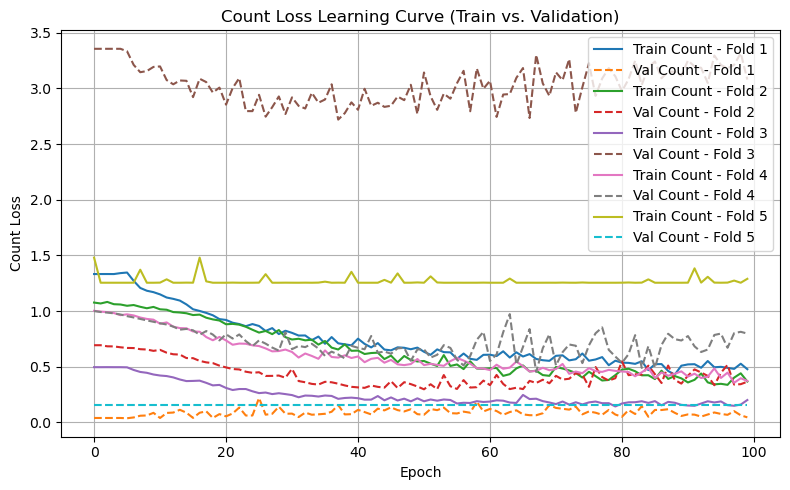

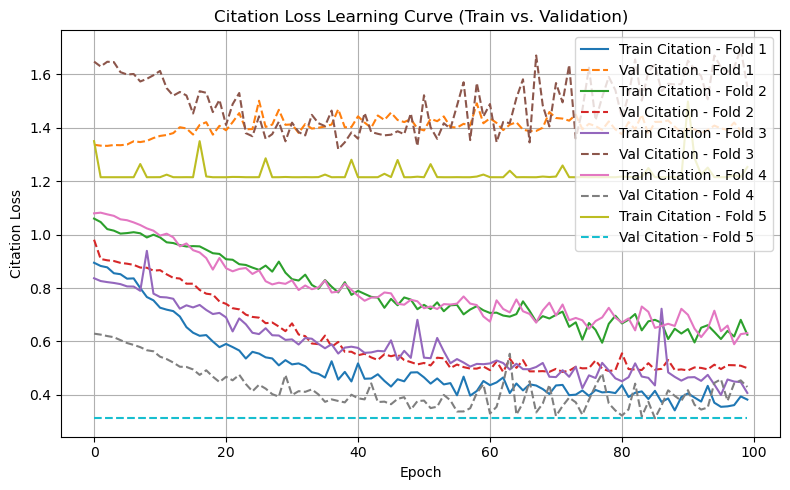

In [23]:
import matplotlib.pyplot as plt

# Count Loss Learning Curve
plt.figure(figsize=(8, 5))
for fold_id in range(5):
    plt.plot(all_train_losses_count[fold_id], label=f"Train Count - Fold {fold_id+1}")
    plt.plot(all_val_losses_count[fold_id], label=f"Val Count - Fold {fold_id+1}", linestyle='--')
plt.xlabel("Epoch")
plt.ylabel("Count Loss")
plt.title("Count Loss Learning Curve (Train vs. Validation)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Citation Loss Learning Curve
plt.figure(figsize=(8, 5))
for fold_id in range(5):
    plt.plot(all_train_losses_citation[fold_id], label=f"Train Citation - Fold {fold_id+1}")
    plt.plot(all_val_losses_citation[fold_id], label=f"Val Citation - Fold {fold_id+1}", linestyle='--')
plt.xlabel("Epoch")
plt.ylabel("Citation Loss")
plt.title("Citation Loss Learning Curve (Train vs. Validation)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


/tmp/ipykernel_771388/3427012061.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return ((tensor - shift_array) * std_array) + mean_array


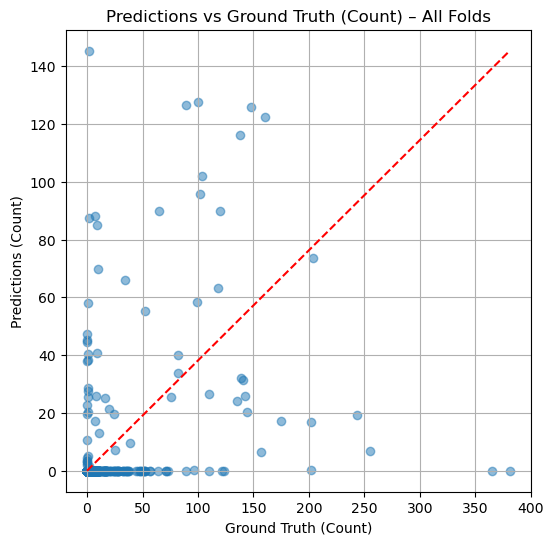

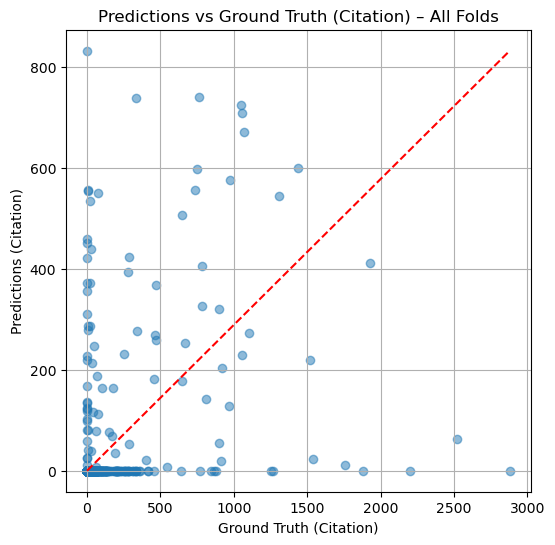

In [24]:
import matplotlib.pyplot as plt
import numpy as np

# 合併所有驗證資料
y_pred_all = torch.cat([tensor for fold in all_val_preds_total for tensor in fold])
y_true_all = torch.cat([tensor for fold in all_val_targets_total for tensor in fold])

# 還原 
y_pred_all = unnormalize_shifted(y_pred_all, y_mean_array, y_std_array, shift_array)
y_true_all = unnormalize_shifted(y_true_all, y_mean_array, y_std_array, shift_array)

# Count 圖
plt.figure(figsize=(6, 6))
plt.scatter(y_true_all[:, 0], y_pred_all[:, 0], alpha=0.5)
plt.plot([y_true_all[:, 0].min(), y_true_all[:, 0].max()],
         [y_pred_all[:, 0].min(), y_pred_all[:, 0].max()], 'r--')
plt.xlabel("Ground Truth (Count)")
plt.ylabel("Predictions (Count)")
plt.title("Predictions vs Ground Truth (Count) – All Folds")
plt.grid(True)
plt.show()

# Citation 圖
plt.figure(figsize=(6, 6))
plt.scatter(y_true_all[:, 1], y_pred_all[:, 1], alpha=0.5)
plt.plot([y_true_all[:, 1].min(), y_true_all[:, 1].max()],
         [y_pred_all[:, 1].min(), y_pred_all[:, 1].max()], 'r--')
plt.xlabel("Ground Truth (Citation)")
plt.ylabel("Predictions (Citation)")
plt.title("Predictions vs Ground Truth (Citation) – All Folds")
plt.grid(True)
plt.show()


In [25]:
print(f"Total number of samples: {y_true_all.shape[0]}")

Total number of samples: 1488
